In [3]:
import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

In [4]:
from pathlib import Path

IMAGES_PATH = Path() / "images" / "generative"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

### Performing PCA with an Undercomplete Linear Autoencoder

Building an Autoencoder

In [3]:
import tensorflow as tf

tf.random.set_seed(42)  # ensures reproducibility

encoder = tf.keras.Sequential([tf.keras.layers.Dense(2)])
decoder = tf.keras.Sequential([tf.keras.layers.Dense(3)])
autoencoder = tf.keras.Sequential([encoder, decoder])

optimizer = tf.keras.optimizers.SGD(learning_rate=0.5)
autoencoder.compile(loss="mse", optimizer=optimizer)

In [4]:
# builds the same 3D dataset

import numpy as np
from scipy.spatial.transform import Rotation

m = 60
X = np.zeros((m, 3))  # initialize 3D dataset
np.random.seed(42)
angles = (np.random.rand(m) ** 3 + 0.5) * 2 * np.pi  # uneven distribution
X[:, 0], X[:, 1] = np.cos(angles), np.sin(angles) * 0.5  # oval
X += 0.28 * np.random.randn(m, 3)  # add more noise
X = Rotation.from_rotvec([np.pi / 29, -np.pi / 20, np.pi / 4]).apply(X)
X_train = X + [0.2, 0, 0.2]  # shift a bit

In [5]:
history = autoencoder.fit(X_train, X_train, epochs=500, verbose=False)
codings = encoder.predict(X_train)

2/2 [==============================] - 0s 9ms/step


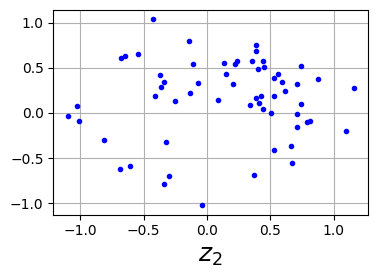

In [6]:
fig = plt.figure(figsize=(4, 3))
plt.plot(codings[:, 0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.xlabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
save_fig("linear_autoencoder_pca_plot")
plt.show()

### Stacked Autoencoders

**Implementing a Stacked Autoencoder Using Keras**

Loading the fashion MNIST dataset, scaling it and splitting it into a training set, a validation set and a test set

In [7]:
fashion_mnist = tf.keras.datasets.fashion_mnist.load_data()
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255

X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

4422102/4422102 [==============================] - 0s 0us/step


Building and training a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders)

In [8]:
tf.random.set_seed(42)

stacked_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(30, activation="relu"),
])
stacked_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28]),
])

stacked_ae = tf.keras.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="mse", optimizer="nadam")
history = stacked_ae.fit(X_train, X_train, epochs=20,
                         validation_data=(X_valid, X_valid))

Epoch 1/20
1719/1719 [==============================] - 21s 8ms/step - loss: 0.0232 - val_loss: 0.0177
Epoch 2/20
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0168 - val_loss: 0.0165
Epoch 3/20
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0159 - val_loss: 0.0157
Epoch 4/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0154 - val_loss: 0.0153
Epoch 5/20
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0150 - val_loss: 0.0150
Epoch 6/20
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0148 - val_loss: 0.0148
Epoch 7/20
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0146 - val_loss: 0.0148
Epoch 8/20
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0144 - val_loss: 0.0147
Epoch 9/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0143 - val_loss: 0.0145
Epoch 10/20
1719/1719 [==============================] - 8s 5ms/step - loss: 0.01

### Visualizing the Reconstructions

This function processes a few validation images through the autoencoder and displays the original images and their reconstruction

1/1 [==============================] - 0s 63ms/step


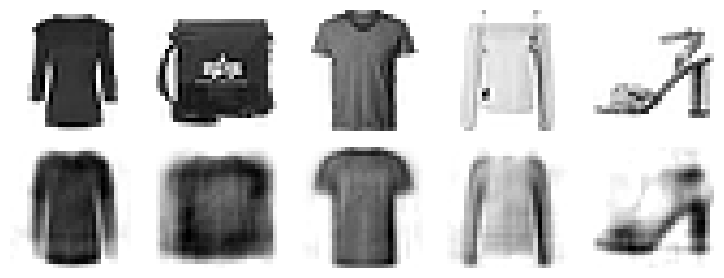

In [9]:
import numpy as np

def plot_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = np.clip(model.predict(images[:n_images]), 0, 1)
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plt.imshow(images[image_index], cmap="binary")
        plt.axis("off")
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plt.imshow(reconstructions[image_index], cmap="binary")
        plt.axis("off")

plot_reconstructions(stacked_ae)
save_fig("reconstruction_plot")  # saves the high res figure
plt.show()

The reconstructions look fuzzy because the images were compressed down to just 30 numbers, instead of 784

### Visualizing the Fashion MNIST Dataset

In [10]:
from sklearn.manifold import TSNE

X_valid_compress = stacked_encoder.predict(X_valid)
tsne = TSNE(init="pca", learning_rate="auto", random_state=42)
X_valid_2D = tsne.fit_transform(X_valid_compress)

157/157 [==============================] - 0s 2ms/step


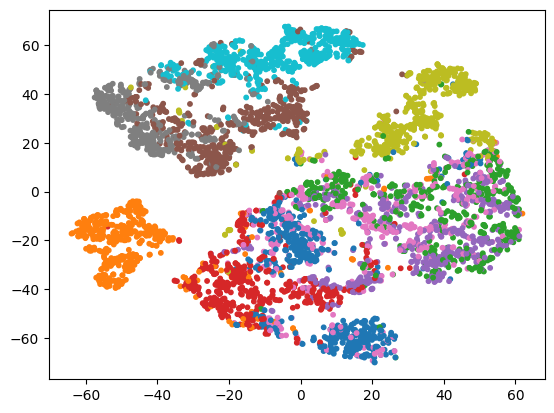

In [11]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
plt.show()

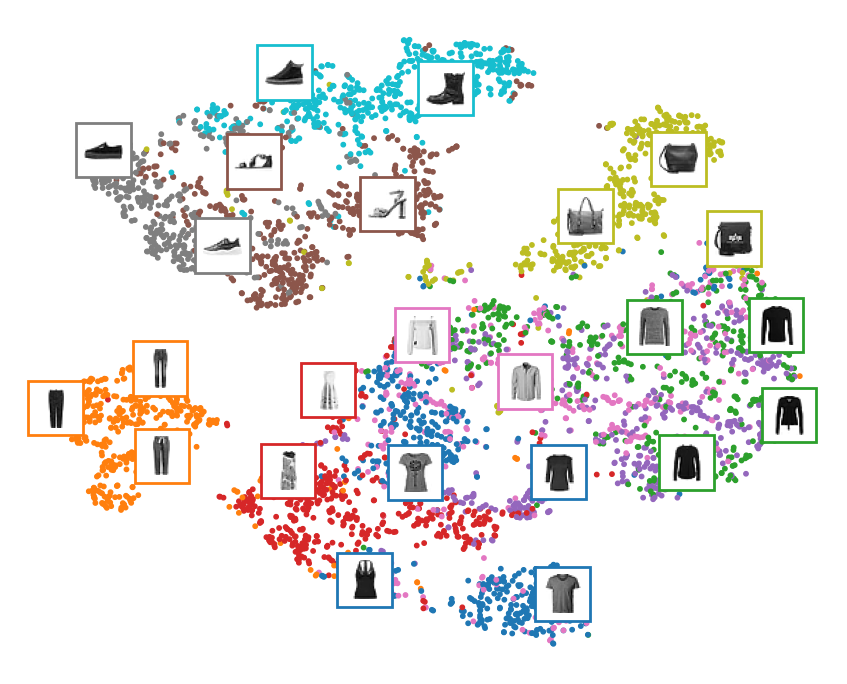

In [12]:
# beautifies the previous diagram

import matplotlib as mpl

plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
Z = X_valid_2D
Z = (Z - Z.min()) / (Z.max() - Z.min())  # normalize to the 0-1 range
plt.scatter(Z[:, 0], Z[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(Z):
    dist = ((position - image_positions) ** 2).sum(axis=1)
    if dist.min() > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)

plt.axis("off")
save_fig("fashion_mnist_visualization_plot")
plt.show()

### Tying Weights

It is common to tie the wieghts of the encoder and the decer, by simply using the transpose of the encoder;s weights as the decoder weights. For this, we need to use a custom layer

In [13]:
class DenseTranspose(tf.keras.layers.Layer):
  def __init__(self, dense, activation=None, **kwargs):
    super().__init__(**kwargs)
    self.dense = dense
    self.activation = tf.keras.activations.get(activation)

  def build(self, batch_input_shape):
    self.biases = self.add_weight(name="bias",
                                  shape=self.dense.input_shape[-1],
                                  initializer="zeros")
    super().build(batch_input_shape)

  def call(self, inputs):
    Z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
    return self.activation(Z + self.biases)

In [14]:
tf.random.set_seed(42)

dense_1 = tf.keras.layers.Dense(100, activation="relu")
dense_2 = tf.keras.layers.Dense(30, activation="relu")

tied_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    dense_1,
    dense_2
])
tied_decoder = tf.keras.Sequential([
    DenseTranspose(dense_2, activation="relu"),
    DenseTranspose(dense_1),
    tf.keras.layers.Reshape([28, 28])
])

tied_ae = tf.keras.Sequential([tied_encoder, tied_decoder])

# compile and fits the model
tied_ae.compile(loss="mse", optimizer="nadam")
history = tied_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 10s 5ms/step - loss: 0.0221 - val_loss: 0.0162
Epoch 2/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0154 - val_loss: 0.0151
Epoch 3/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0148 - val_loss: 0.0146
Epoch 4/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0144 - val_loss: 0.0144
Epoch 5/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0141 - val_loss: 0.0142
Epoch 6/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0139 - val_loss: 0.0139
Epoch 7/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0138 - val_loss: 0.0138
Epoch 8/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0136 - val_loss: 0.0139
Epoch 9/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0135 - val_loss: 0.0137
Epoch 10/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.01

1/1 [==============================] - 0s 60ms/step


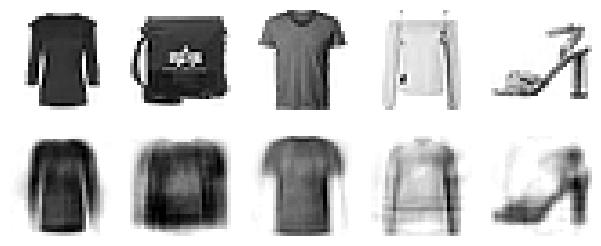

In [15]:
plot_reconstructions(tied_ae)
plt.show()

### Training one Autoencoder at a Time

In [16]:
def train_autoencoder(n_neurons, X_train, X_valid, n_epochs=10,
                      output_activation=None):
  n_inputs = X_train.shape[-1]
  encoder = tf.keras.layers.Dense(n_neurons, activation="relu")
  decoder = tf.keras.layers.Dense(n_inputs, activation=output_activation)
  autoencoder = tf.keras.Sequential([encoder, decoder])
  autoencoder.compile(loss="mse", optimizer="nadam")
  autoencoder.fit(X_train, X_train, epochs=n_epochs,
                  validation_data=(X_valid, X_valid))

  return encoder, decoder, encoder(X_train), encoder(X_valid)

In [17]:
tf.random.set_seed(42)

X_train_flat = tf.keras.layers.Flatten()(X_train)
X_valid_flat = tf.keras.layers.Flatten()(X_valid)
enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
    100, X_train_flat, X_valid_flat)
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_valid_enc1, output_activation="relu")

Epoch 1/10
1719/1719 [==============================] - 7s 3ms/step - loss: 0.0183 - val_loss: 0.0117
Epoch 2/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0107 - val_loss: 0.0101
Epoch 3/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.0099 - val_loss: 0.0098
Epoch 4/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0096 - val_loss: 0.0095
Epoch 5/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.0094 - val_loss: 0.0093
Epoch 6/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.0092 - val_loss: 0.0091
Epoch 7/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.0091 - val_loss: 0.0090
Epoch 8/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.0090 - val_loss: 0.0109
Epoch 9/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0090 - val_loss: 0.0090
Epoch 10/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.009

In [18]:
stacked_ae_1_by_1 = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    enc1, enc2, dec2, dec1,
    tf.keras.layers.Reshape([28, 28])
])

1/1 [==============================] - 0s 130ms/step


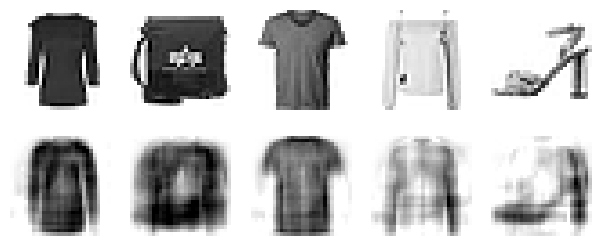

In [19]:
plot_reconstructions(stacked_ae_1_by_1)
plt.show()

In [20]:
stacked_ae_1_by_1.compile(loss="mse", optimizer="nadam")
history = stacked_ae_1_by_1.fit(X_train, X_train, epochs=5,
                                validation_data=(X_valid, X_valid))

Epoch 1/5
1719/1719 [==============================] - 9s 4ms/step - loss: 0.0164 - val_loss: 0.0157
Epoch 2/5
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0149 - val_loss: 0.0145
Epoch 3/5
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0140 - val_loss: 0.0141
Epoch 4/5
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0136 - val_loss: 0.0135
Epoch 5/5
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0133 - val_loss: 0.0133


1/1 [==============================] - 0s 63ms/step


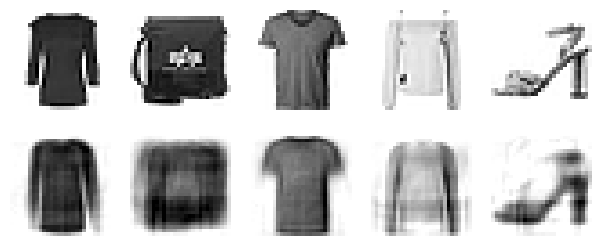

In [21]:
plot_reconstructions(stacked_ae_1_by_1)
plt.show()

### Convolutional Autoencoders

Building a stacked autoencoder with 3 hidden layers and 1 outputs layer (i.e., 2 stacked Autoencoders)

In [22]:
tf.random.set_seed(42)

conv_encoder = tf.keras.Sequential([
    tf.keras.layers.Reshape([28, 28, 1]),
    tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(32, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(64, 3, padding="same", activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(30, 3, padding="same", activation="relu"),
    tf.keras.layers.GlobalAvgPool2D()  # output: 30
])
conv_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(3 * 3 * 16),
    tf.keras.layers.Reshape((3, 3, 16)),
    tf.keras.layers.Conv2DTranspose(32, 3, strides=2, activation="relu"),
    tf.keras.layers.Conv2DTranspose(16, 3, strides=2, padding="same",
                                    activation="relu"),
    tf.keras.layers.Conv2DTranspose(1, 3, strides=2, padding="same"),
    tf.keras.layers.Reshape([28, 28]),
])
conv_ae = tf.keras.Sequential([conv_encoder, conv_decoder])

conv_ae.compile(loss="mse", optimizer="nadam")
history = conv_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 22s 8ms/step - loss: 0.0294 - val_loss: 0.0207
Epoch 2/10
1719/1719 [==============================] - 13s 8ms/step - loss: 0.0188 - val_loss: 0.0175
Epoch 3/10
1719/1719 [==============================] - 13s 8ms/step - loss: 0.0167 - val_loss: 0.0159
Epoch 4/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.0155 - val_loss: 0.0150
Epoch 5/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.0146 - val_loss: 0.0141
Epoch 6/10
1719/1719 [==============================] - 13s 8ms/step - loss: 0.0139 - val_loss: 0.0135
Epoch 7/10
1719/1719 [==============================] - 13s 8ms/step - loss: 0.0133 - val_loss: 0.0132
Epoch 8/10
1719/1719 [==============================] - 13s 8ms/step - loss: 0.0128 - val_loss: 0.0128
Epoch 9/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.0124 - val_loss: 0.0124
Epoch 10/10
1719/1719 [==============================] - 13s 8ms/step - l

1/1 [==============================] - 0s 262ms/step


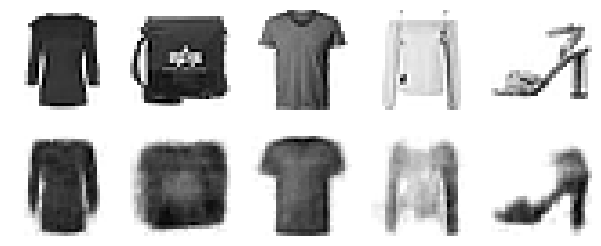

In [23]:
# shows the reconstructions
plot_reconstructions(conv_ae)
plt.show()

### Recurrent Autoencoders

In [24]:
tf.random.set_seed(42)

recurrent_encoder = tf.keras.Sequential([
    tf.keras.layers.LSTM(100, return_sequences=True),
    tf.keras.layers.LSTM(30)
])
recurrent_decoder = tf.keras.Sequential([
    tf.keras.layers.RepeatVector(28),
    tf.keras.layers.LSTM(100, return_sequences=True),
    tf.keras.layers.Dense(28)
])
recurrent_ae = tf.keras.Sequential([recurrent_encoder, recurrent_decoder])
recurrent_ae.compile(loss="mse", optimizer="nadam")

In [25]:
history = recurrent_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 30s 12ms/step - loss: 0.0262 - val_loss: 0.0193
Epoch 2/10
1719/1719 [==============================] - 20s 12ms/step - loss: 0.0177 - val_loss: 0.0165
Epoch 3/10
1719/1719 [==============================] - 19s 11ms/step - loss: 0.0155 - val_loss: 0.0154
Epoch 4/10
1719/1719 [==============================] - 20s 12ms/step - loss: 0.0141 - val_loss: 0.0135
Epoch 5/10
1719/1719 [==============================] - 20s 12ms/step - loss: 0.0132 - val_loss: 0.0129
Epoch 6/10
1719/1719 [==============================] - 20s 12ms/step - loss: 0.0125 - val_loss: 0.0121
Epoch 7/10
1719/1719 [==============================] - 19s 11ms/step - loss: 0.0119 - val_loss: 0.0121
Epoch 8/10
1719/1719 [==============================] - 19s 11ms/step - loss: 0.0115 - val_loss: 0.0116
Epoch 9/10
1719/1719 [==============================] - 20s 12ms/step - loss: 0.0111 - val_loss: 0.0111
Epoch 10/10
1719/1719 [==============================] - 19s 11m

1/1 [==============================] - 1s 930ms/step


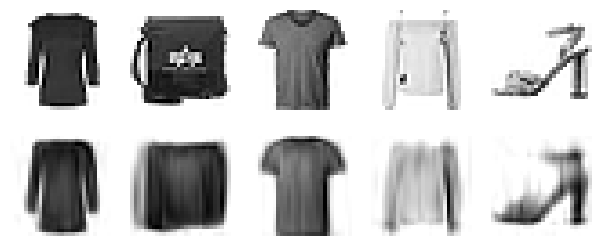

In [26]:
plot_reconstructions(recurrent_ae)
plt.show()

### Denoising Autoencoders

Using dropout:

In [27]:
tf.random.set_seed(42)  # ensures reproducibility

dropout_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(30, activation="relu")
])
dropout_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28])
])
dropout_ae = tf.keras.Sequential([dropout_encoder, dropout_decoder])

# compiles and fits the model
dropout_ae.compile(loss="mse", optimizer="nadam")
history = dropout_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 11s 4ms/step - loss: 0.0287 - val_loss: 0.0211
Epoch 2/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0218 - val_loss: 0.0193
Epoch 3/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0206 - val_loss: 0.0187
Epoch 4/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0199 - val_loss: 0.0180
Epoch 5/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0194 - val_loss: 0.0174
Epoch 6/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0190 - val_loss: 0.0173
Epoch 7/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0187 - val_loss: 0.0169
Epoch 8/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0185 - val_loss: 0.0167
Epoch 9/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0183 - val_loss: 0.0166
Epoch 10/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.01

1/1 [==============================] - 0s 66ms/step


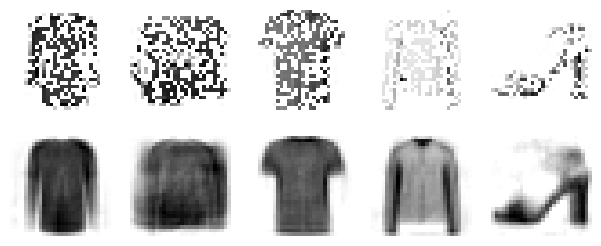

In [28]:
tf.random.set_seed(42)
dropout = tf.keras.layers.Dropout(0.5)
plot_reconstructions(dropout_ae, dropout(X_valid, training=True))

### Sparse Autoencoder

In [29]:
tf.random.set_seed(42)

sparse_l1_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(300, activation="sigmoid"),
    tf.keras.layers.ActivityRegularization(l1=1e-4),
])
sparse_l1_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28]),
])
sparse_l1_ae = tf.keras.Sequential([sparse_l1_encoder, sparse_l1_decoder])

sparse_l1_ae.compile(loss="mse", optimizer="nadam")
history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 11s 5ms/step - loss: 0.0280 - val_loss: 0.0192
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0172 - val_loss: 0.0160
Epoch 3/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0149 - val_loss: 0.0147
Epoch 4/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0137 - val_loss: 0.0133
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0129 - val_loss: 0.0128
Epoch 6/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0124 - val_loss: 0.0123
Epoch 7/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0120 - val_loss: 0.0119
Epoch 8/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0116 - val_loss: 0.0115
Epoch 9/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0113 - val_loss: 0.0113
Epoch 10/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.01

1/1 [==============================] - 0s 73ms/step


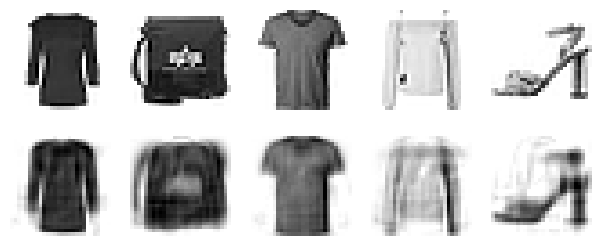

In [30]:
plot_reconstructions(sparse_l1_ae)
plt.show()

Plotting the KL Divergence loss, versus the MAE and MSE:

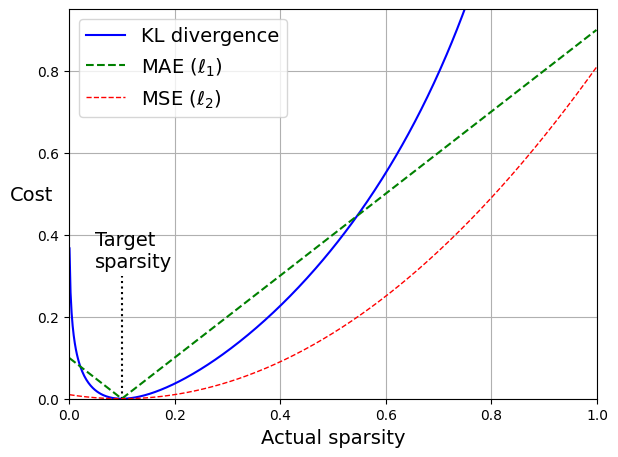

In [31]:
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q) ** 2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])
plt.grid(True)
save_fig("sparsity_loss_plot")

Defining a custom regularizer for KL-Divergence regularization

In [32]:
kl_divergence = tf.keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, weight, target):
        self.weight = weight
        self.target = target

    def __call__(self, inputs):
        mean_activities = tf.reduce_mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

In [33]:
tf.random.set_seed(42)

kld_reg = KLDivergenceRegularizer(weight=5e-3, target=0.1)
sparse_kl_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(300, activation="sigmoid",
                          activity_regularizer=kld_reg)
])
sparse_kl_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28])
])
sparse_kl_ae = tf.keras.Sequential([sparse_kl_encoder, sparse_kl_decoder])

sparse_l1_ae.compile(loss="mse", optimizer="nadam")
history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 10s 5ms/step - loss: 0.0109 - val_loss: 0.0111
Epoch 2/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0107 - val_loss: 0.0107
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0106 - val_loss: 0.0108
Epoch 4/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0105 - val_loss: 0.0107
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0103 - val_loss: 0.0105
Epoch 6/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0102 - val_loss: 0.0103
Epoch 7/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0101 - val_loss: 0.0101
Epoch 8/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0100 - val_loss: 0.0102
Epoch 9/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0100 - val_loss: 0.0101
Epoch 10/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.00

1/1 [==============================] - 0s 257ms/step


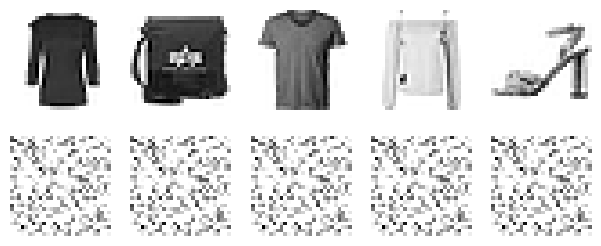

In [34]:
plot_reconstructions(sparse_kl_ae)
plt.show()

### Variational Autoencoder

In [35]:
class Sampling(tf.keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return tf.random.normal(tf.shape(log_var)) * tf.exp(log_var / 2) + mean

In [36]:
tf.random.set_seed(42)

codings_size = 10

inputs = tf.keras.layers.Input(shape=[28, 28])
Z = tf.keras.layers.Flatten()(inputs)
Z = tf.keras.layers.Dense(150, activation="relu")(Z)
Z = tf.keras.layers.Dense(100, activation="relu")(Z)
codings_mean = tf.keras.layers.Dense(codings_size)(Z)  # μ
codings_log_var = tf.keras.layers.Dense(codings_size)(Z)  # γ
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = tf.keras.Model(
    inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

In [37]:
decoder_inputs = tf.keras.layers.Input(shape=[codings_size])
x = tf.keras.layers.Dense(100, activation="relu")(decoder_inputs)
x = tf.keras.layers.Dense(150, activation="relu")(x)
x = tf.keras.layers.Dense(28 * 28)(x)
outputs = tf.keras.layers.Reshape([28, 28])(x)
variational_decoder = tf.keras.Model(inputs=[decoder_inputs], outputs=[outputs])

In [38]:
_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ae = tf.keras.Model(inputs=[inputs], outputs=[reconstructions])

In [39]:
latent_loss = -0.5 * tf.reduce_sum(
    1 + codings_log_var - tf.exp(codings_log_var) - tf.square(codings_mean),
    axis=-1)
variational_ae.add_loss(tf.reduce_mean(latent_loss) / 784.)

In [40]:
variational_ae.compile(loss="mse", optimizer="nadam")
history = variational_ae.fit(X_train, X_train, epochs=25, batch_size=128,
                             validation_data=(X_valid, X_valid))

Epoch 1/25
430/430 [==============================] - 7s 7ms/step - loss: 0.0508 - val_loss: 0.0392
Epoch 2/25
430/430 [==============================] - 4s 8ms/step - loss: 0.0369 - val_loss: 0.0360
Epoch 3/25
430/430 [==============================] - 3s 7ms/step - loss: 0.0350 - val_loss: 0.0347
Epoch 4/25
430/430 [==============================] - 3s 7ms/step - loss: 0.0340 - val_loss: 0.0339
Epoch 5/25
430/430 [==============================] - 3s 7ms/step - loss: 0.0335 - val_loss: 0.0335
Epoch 6/25
430/430 [==============================] - 3s 8ms/step - loss: 0.0331 - val_loss: 0.0331
Epoch 7/25
430/430 [==============================] - 3s 8ms/step - loss: 0.0327 - val_loss: 0.0331
Epoch 8/25
430/430 [==============================] - 3s 7ms/step - loss: 0.0325 - val_loss: 0.0326
Epoch 9/25
430/430 [==============================] - 3s 7ms/step - loss: 0.0323 - val_loss: 0.0325
Epoch 10/25
430/430 [==============================] - 3s 7ms/step - loss: 0.0321 - val_loss: 0.0323

1/1 [==============================] - 0s 124ms/step


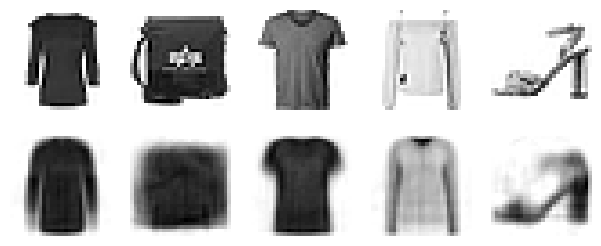

In [41]:
plot_reconstructions(variational_ae)
plt.show()

### Generate Fashion Images

In [42]:
tf.random.set_seed(42)

codings = tf.random.normal(shape=[3 * 7, codings_size])
images = variational_decoder(codings).numpy()

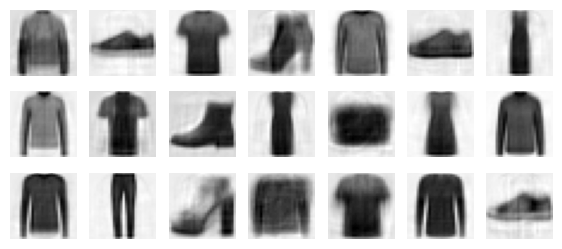

In [43]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

plot_multiple_images(images, 7)
save_fig("vae_generated_images_plot", tight_layout=False)
plt.show()

Semantic interpolation between 2 images

In [ ]:
tf.random.set_seed(42)

codings = np.zeros([7, codings_size])
codings[:, 3] = np.linspace(-0.8, 0.8, 7)
images = variational_decoder(codings).numpy()

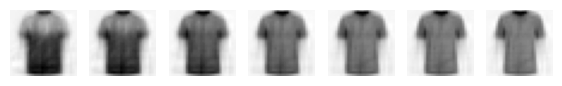

In [45]:
plot_multiple_images(images)
save_fig("semantic_interpolation_plot", tight_layout=False)
plt.show()

### Generative Adversarial Neural Network

In [13]:
tf.random.set_seed(42)

codings_size = 30

Dense = tf.keras.layers.Dense
generator = tf.keras.Sequential([
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(28 * 28, activation="sigmoid"),
    tf.keras.layers.Reshape([28, 28])
])
discriminator = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(1, activation="sigmoid")
])
gan = tf.keras.Sequential([generator, discriminator])

In [14]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [15]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/25


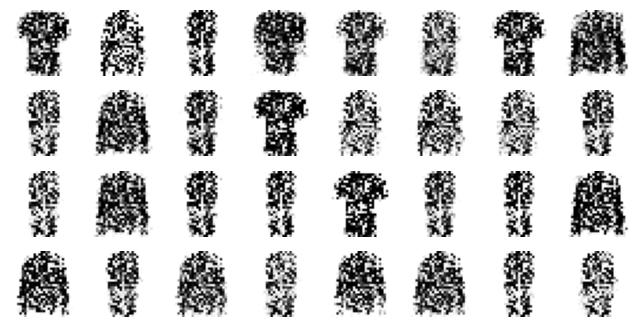

Epoch 2/25


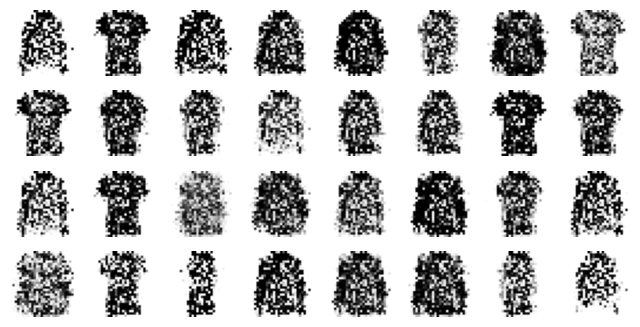

Epoch 3/25


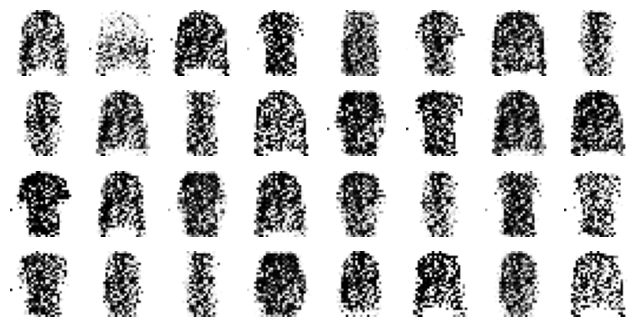

Epoch 4/25


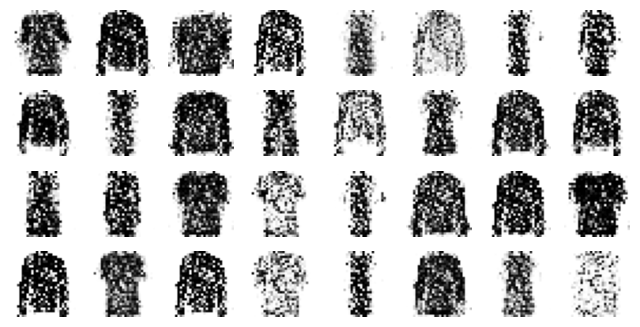

Epoch 5/25


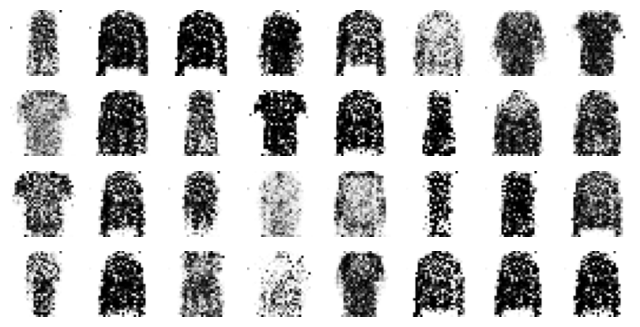

Epoch 6/25


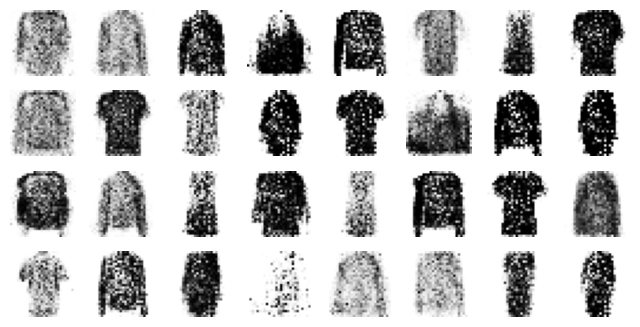

Epoch 7/25


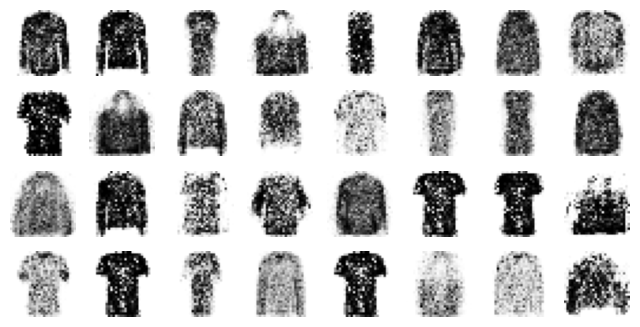

Epoch 8/25


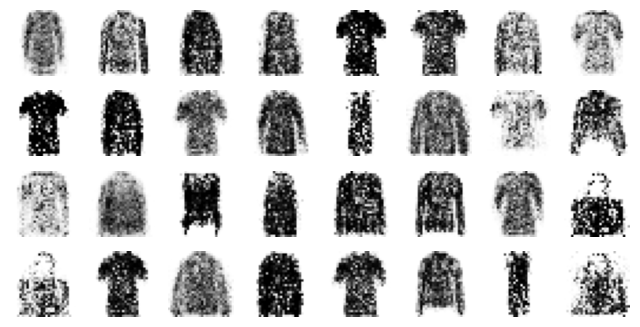

Epoch 9/25


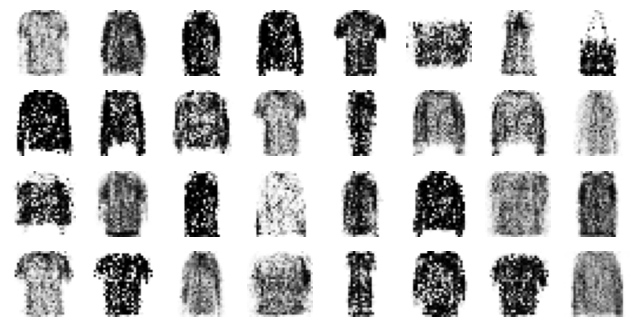

Epoch 10/25


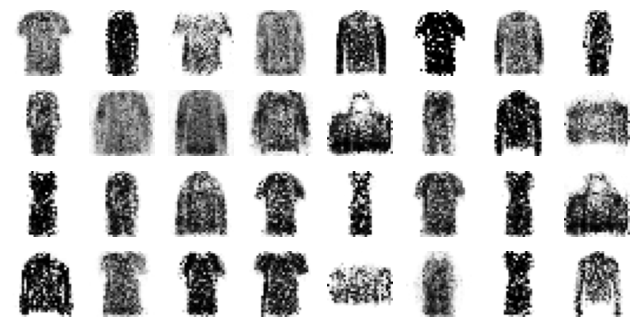

Epoch 11/25


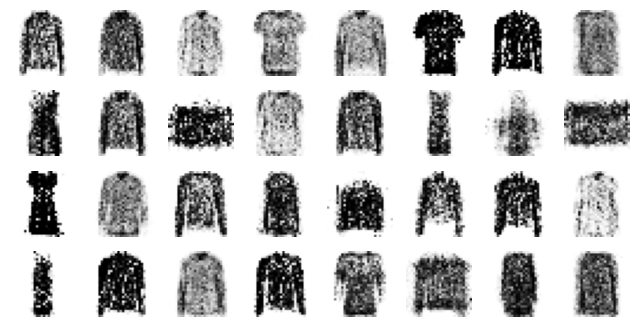

Epoch 12/25


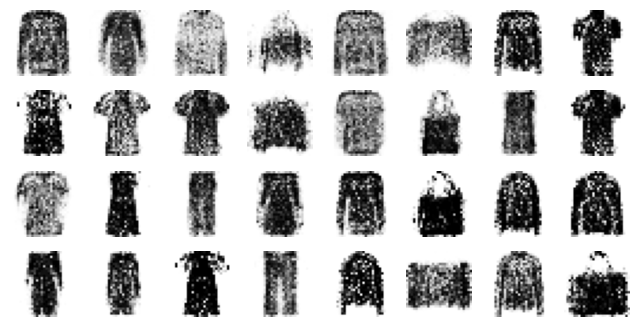

Epoch 13/25


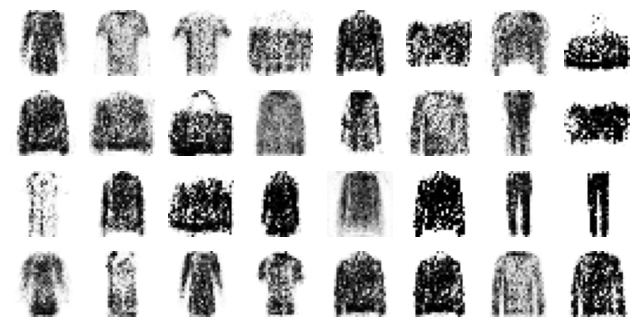

Epoch 14/25


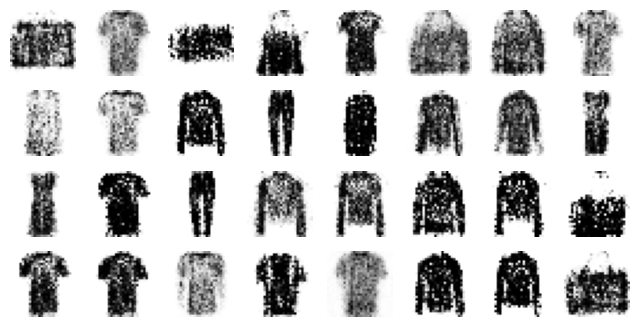

Epoch 15/25


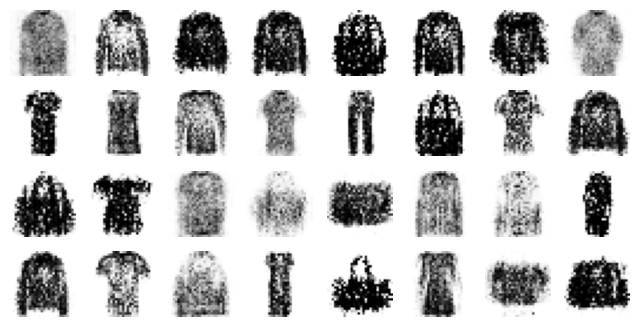

Epoch 16/25


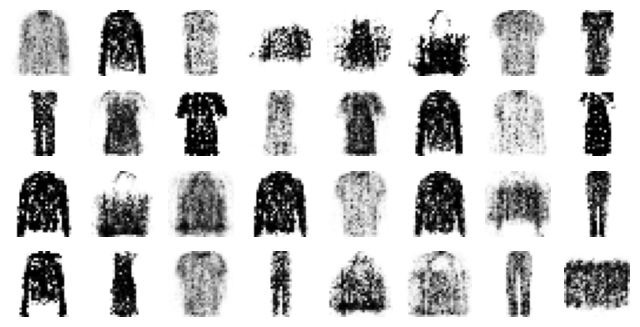

Epoch 17/25


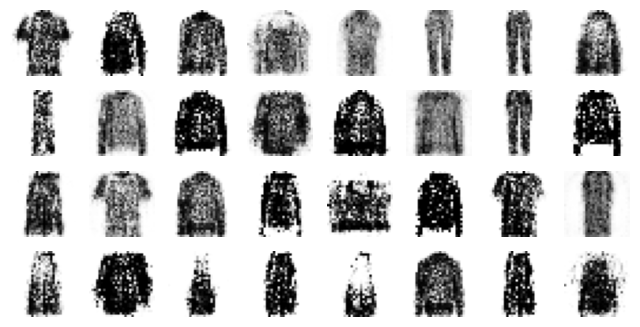

Epoch 18/25


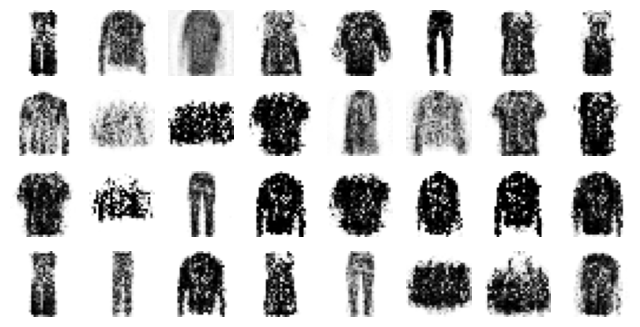

Epoch 19/25


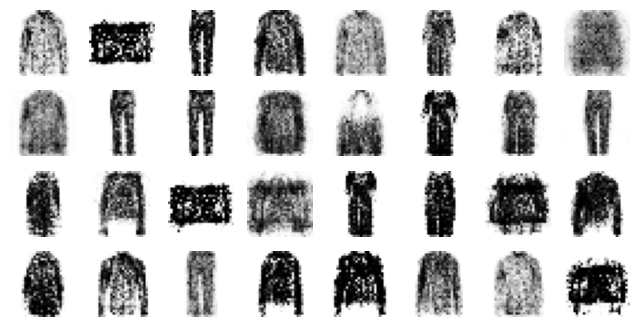

Epoch 20/25


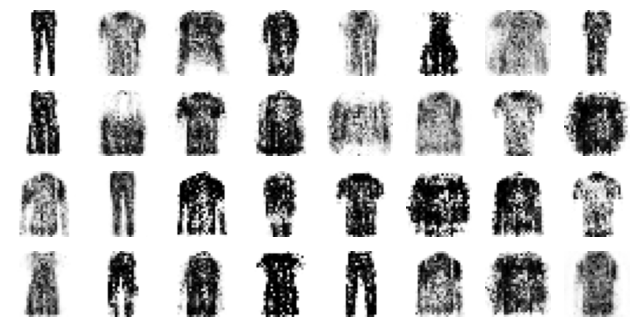

Epoch 21/25


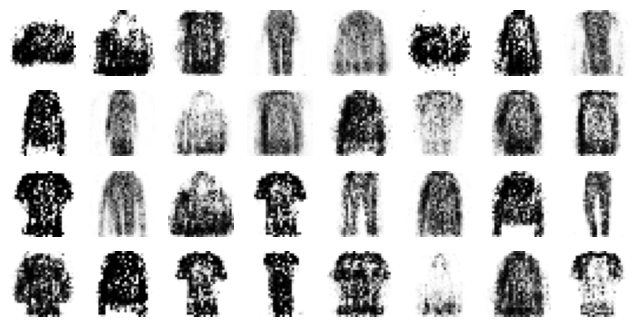

Epoch 22/25


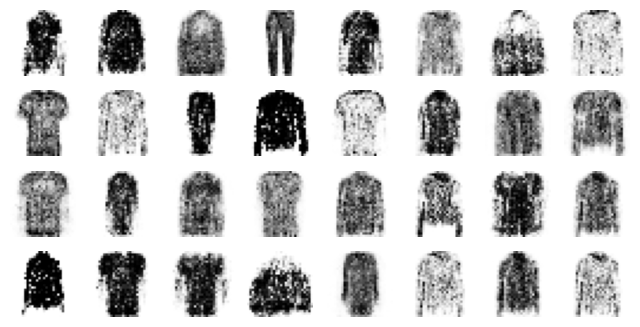

Epoch 23/25


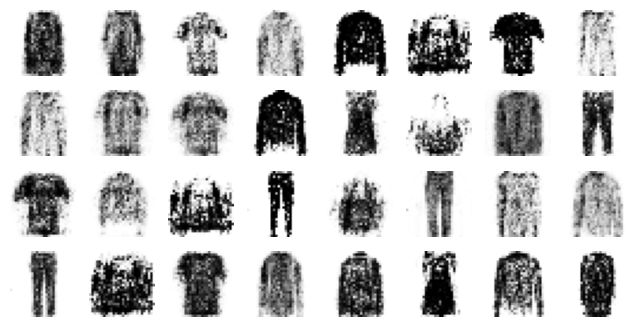

Epoch 24/25


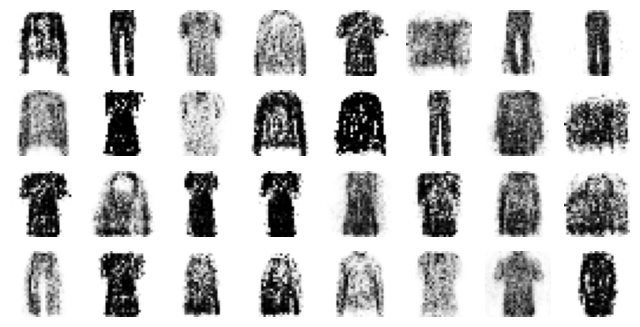

Epoch 25/25


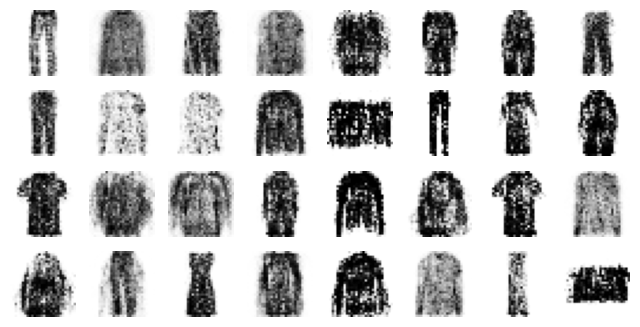

In [16]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}") 
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.train_on_batch(X_fake_and_real, y1)
            
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)

        plot_multiple_images(generated_images.numpy(), 8)
        plt.show()

train_gan(gan, dataset, batch_size, codings_size, n_epochs=25)

In [21]:
tf.random.set_seed(42)

codings = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(codings)

1/1 [==============================] - 0s 101ms/step


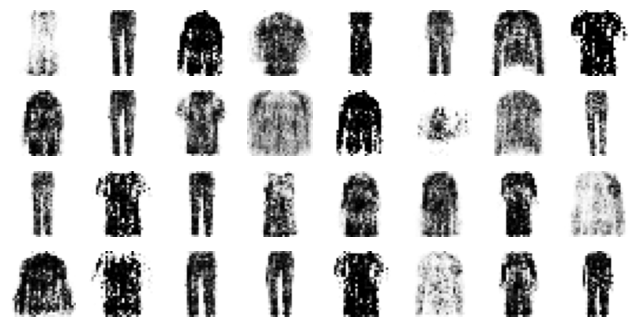

In [22]:
plot_multiple_images(generated_images, 8)
save_fig("gan_generated_images_plot", tight_layout=False)
plt.show()

### Deep Convolutional GAN

In [8]:
tf.random.set_seed(42)  

codings_size = 100

generator = tf.keras.Sequential([
    tf.keras.layers.Dense(7 * 7 * 128),
    tf.keras.layers.Reshape([7, 7, 128]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2,
                                    padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2,
                                    padding="same", activation="tanh"),
])
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="same",
                        activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="same",
                        activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])
gan = tf.keras.Sequential([generator, discriminator])

In [9]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [10]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1.

Epoch 1/30


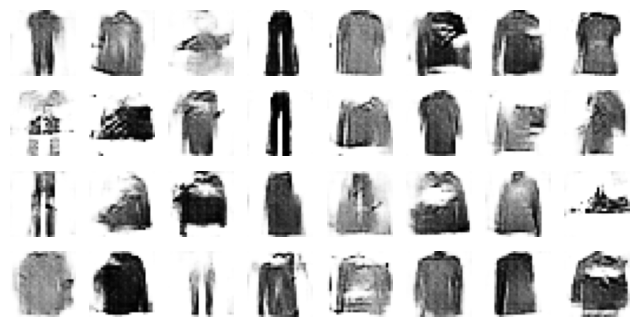

Epoch 2/30


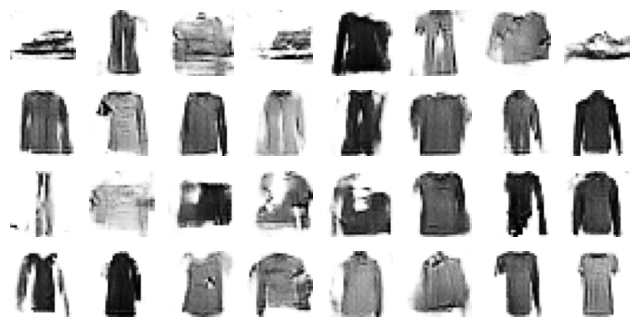

Epoch 3/30


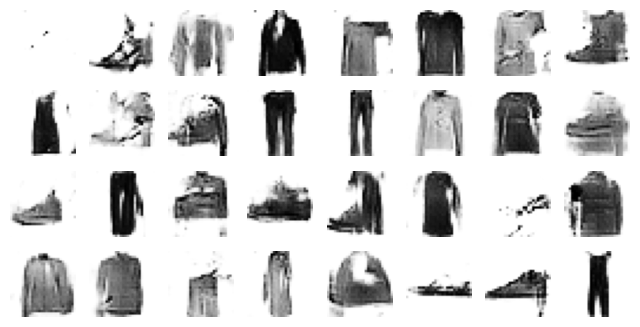

Epoch 4/30


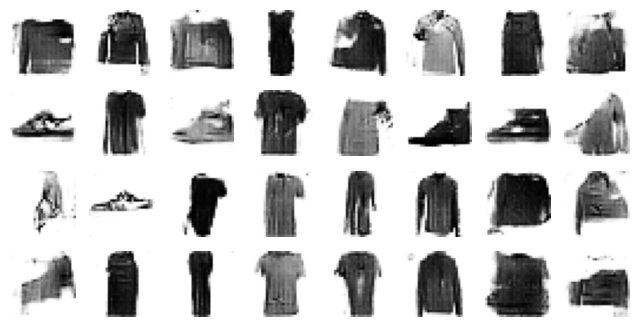

Epoch 5/30


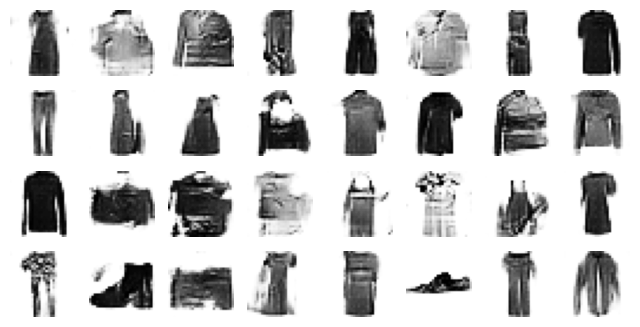

Epoch 6/30


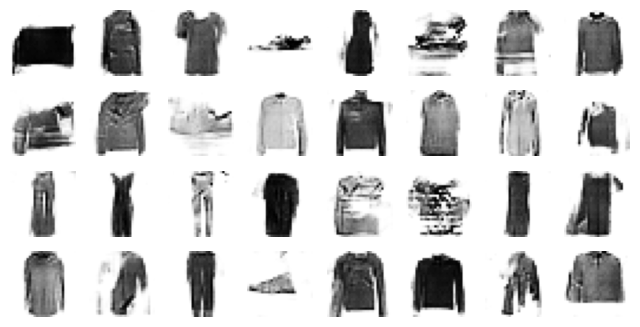

Epoch 7/30


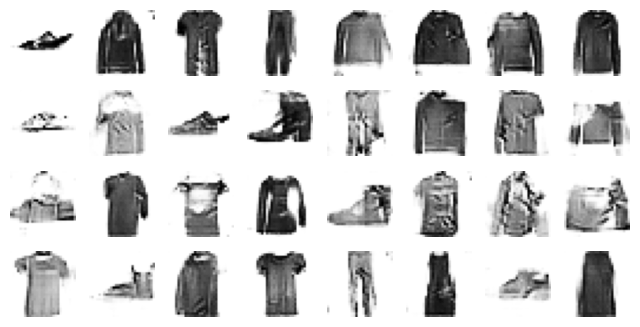

Epoch 8/30


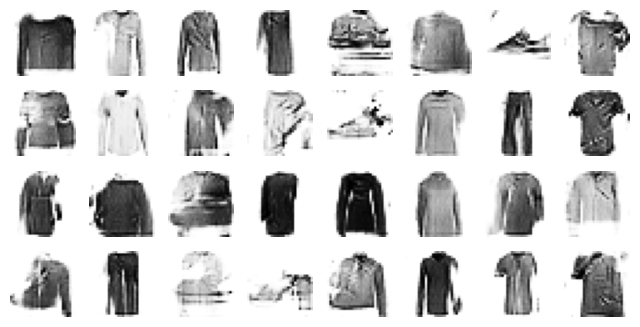

Epoch 9/30


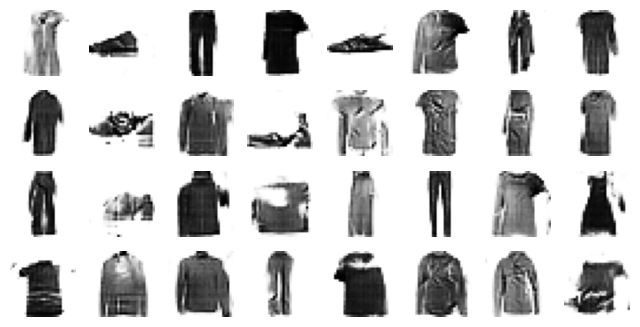

Epoch 10/30


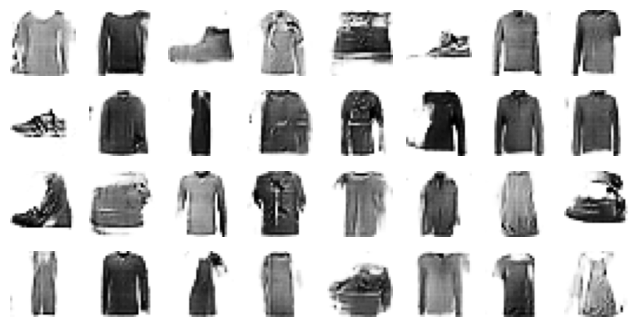

Epoch 11/30


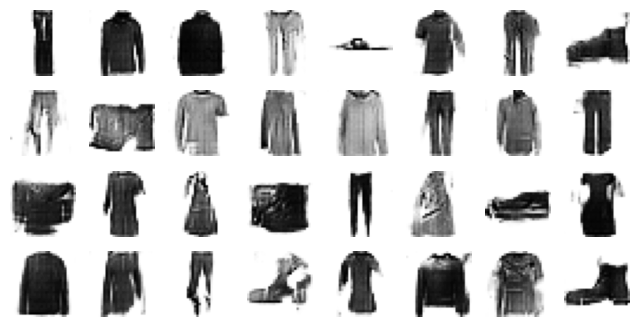

Epoch 12/30


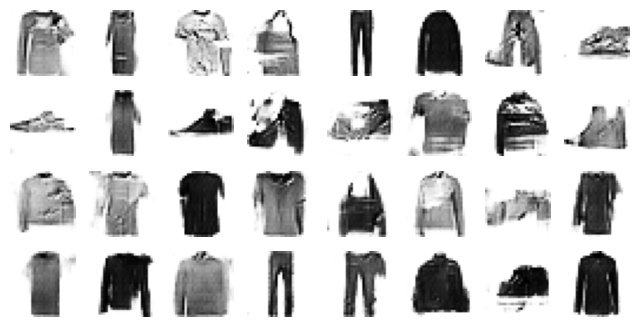

Epoch 13/30


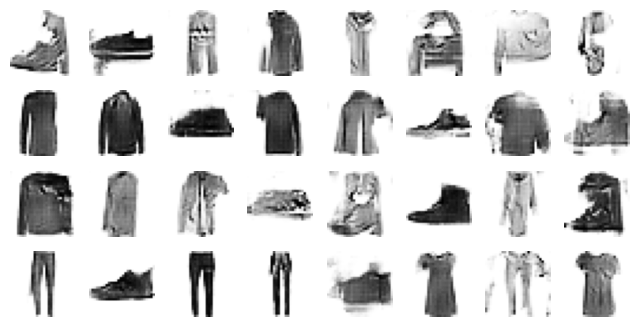

Epoch 14/30


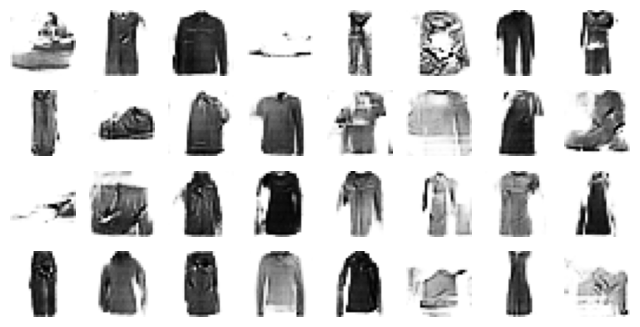

Epoch 15/30


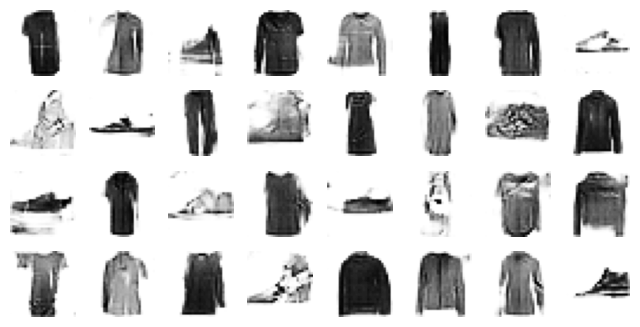

Epoch 16/30


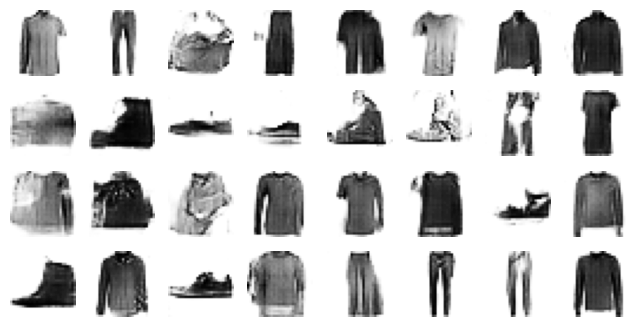

Epoch 17/30


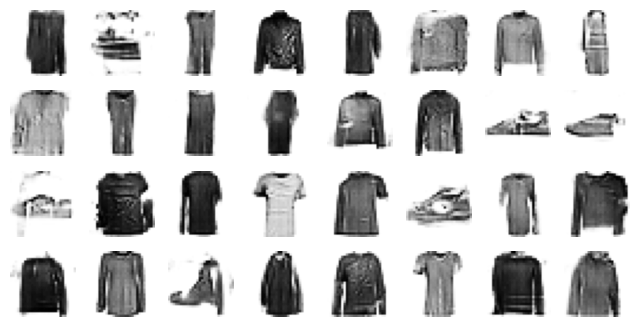

Epoch 18/30


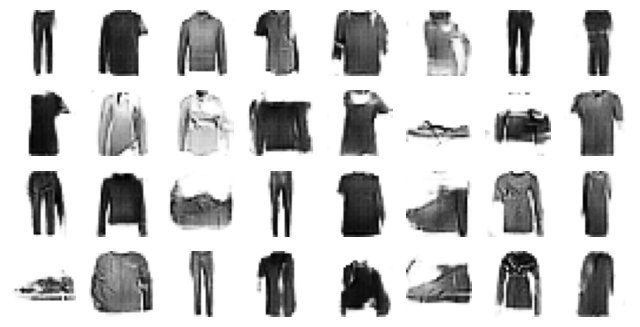

Epoch 19/30


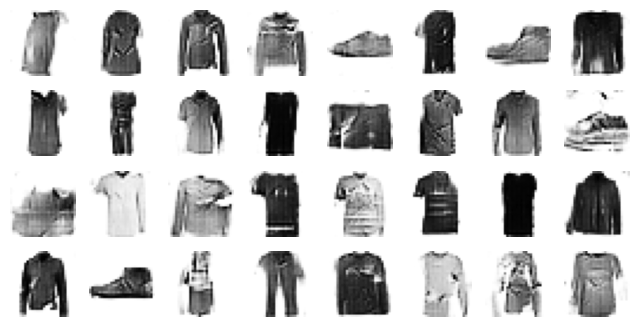

Epoch 20/30


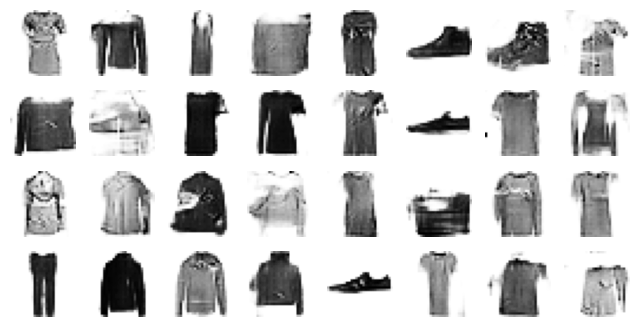

Epoch 21/30


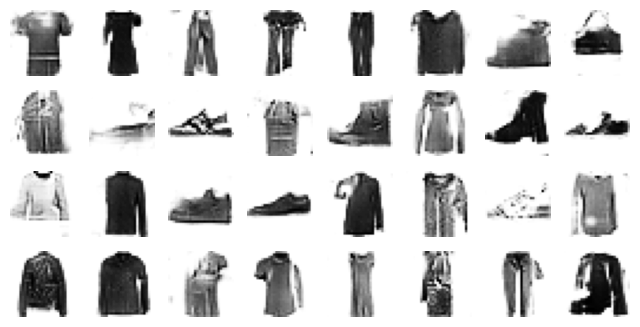

Epoch 22/30


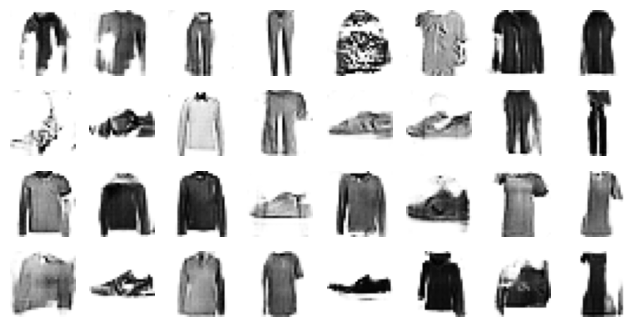

Epoch 23/30


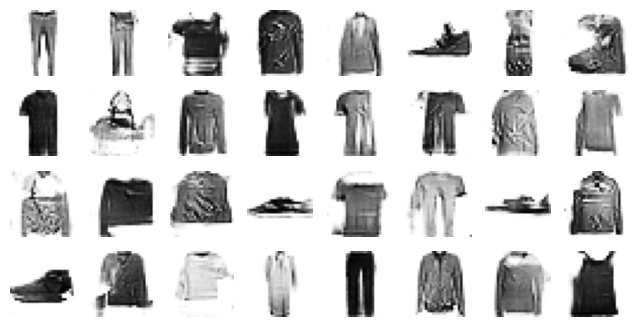

Epoch 24/30


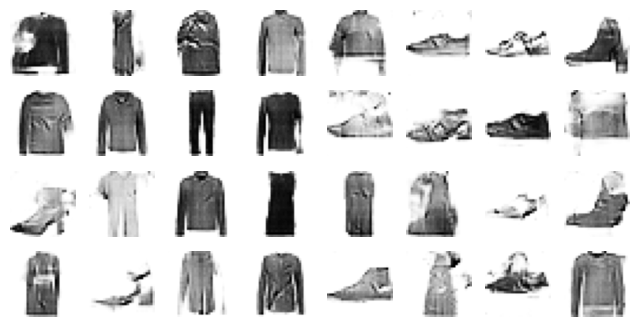

Epoch 25/30


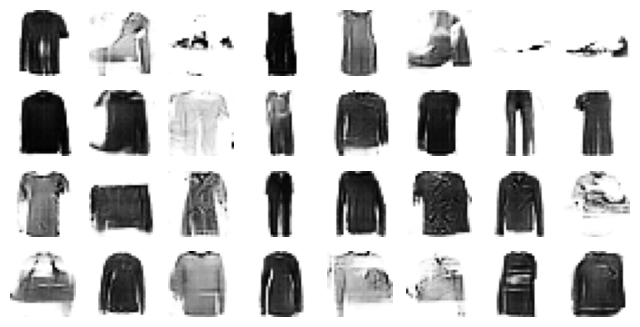

Epoch 26/30


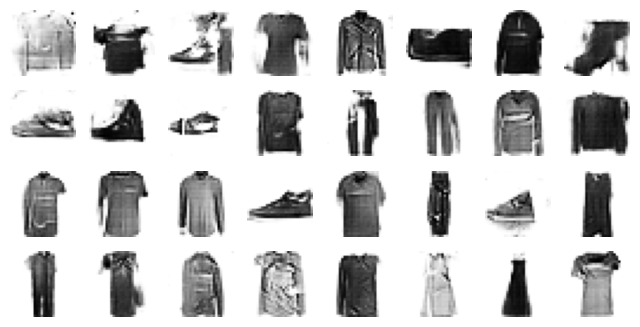

Epoch 27/30


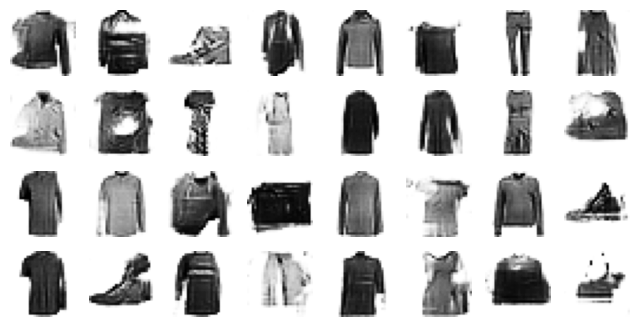

Epoch 28/30


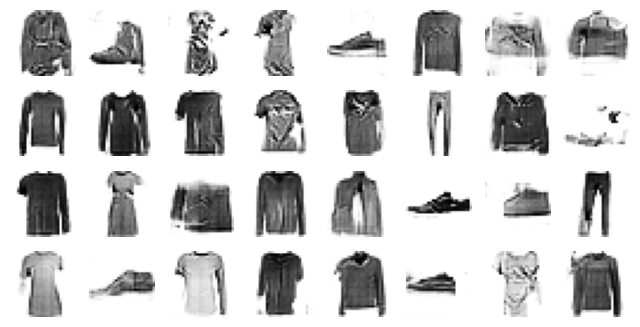

Epoch 29/30


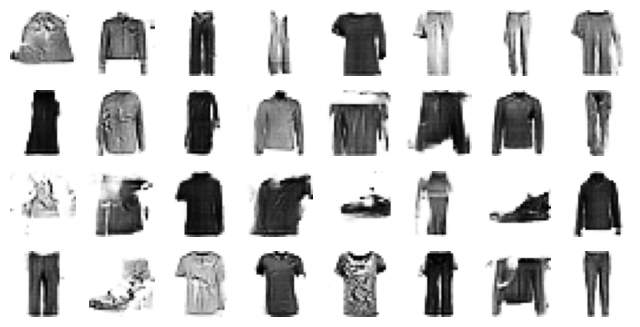

Epoch 30/30


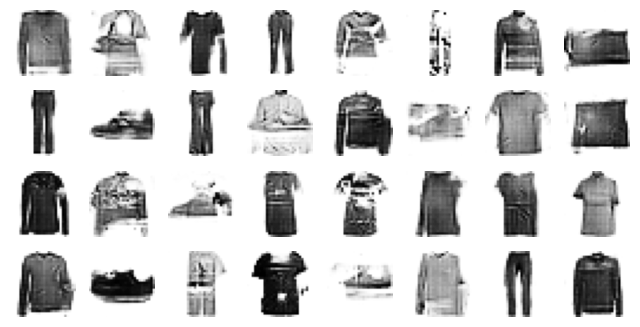

In [13]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)
train_gan(gan, dataset, batch_size, codings_size, n_epochs=30)

1/1 [==============================] - 0s 48ms/step


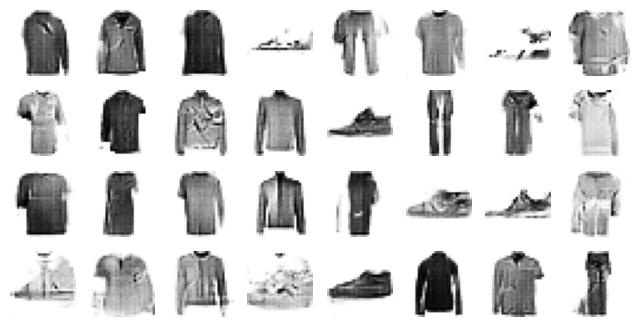

In [20]:
tf.random.set_seed(42)
noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(noise)
plot_multiple_images(generated_images, 8)
save_fig("dcgan_generated_images_plot", tight_layout=False)

### Hashing using Binary Autoencoder

In [6]:
tf.random.set_seed(42)

hashing_encoder = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.GaussianNoise(15.),
    tf.keras.layers.Dense(16, activation="sigmoid")
])
hashing_decoder = tf.keras.Sequential([
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(28 * 28),
    tf.keras.layers.Reshape([28, 28]),
])

hashing_ae = tf.keras.Sequential([hashing_encoder, hashing_decoder])
hashing_ae.compile(loss="mse", optimizer="nadam")
history = hashing_ae.fit(X_train, X_train, epochs=10,
                          validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 18s 6ms/step - loss: 0.0560 - val_loss: 0.0569
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0430 - val_loss: 0.0476
Epoch 3/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.0391 - val_loss: 0.0428
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0369 - val_loss: 0.0408
Epoch 5/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.0358 - val_loss: 0.0366
Epoch 6/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0350 - val_loss: 0.0361
Epoch 7/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0342 - val_loss: 0.0353
Epoch 8/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0337 - val_loss: 0.0345
Epoch 9/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0332 - val_loss: 0.0332
Epoch 10/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0

1/1 [==============================] - 0s 87ms/step


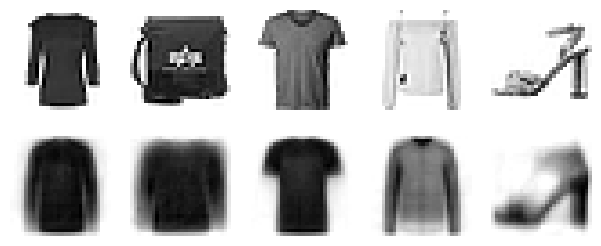

In [9]:
plot_reconstructions(hashing_ae)
plt.show()

How the hashes look like for the first few images:

In [10]:
hashes = hashing_encoder.predict(X_valid).round().astype(np.int32)
hashes *= np.array([2 ** bit for bit in range(16)])
hashes = hashes.sum(axis=1)

for h in hashes[:5]:
  print(f"{h:016b}")
print("...")

157/157 [==============================] - 0s 2ms/step
0011100111001111
0011100010001111
0011100011011110
1011000101100111
1101101010101011
...


Displaying a few images for each hash. In the following images, all the images on a given row have the same hash:

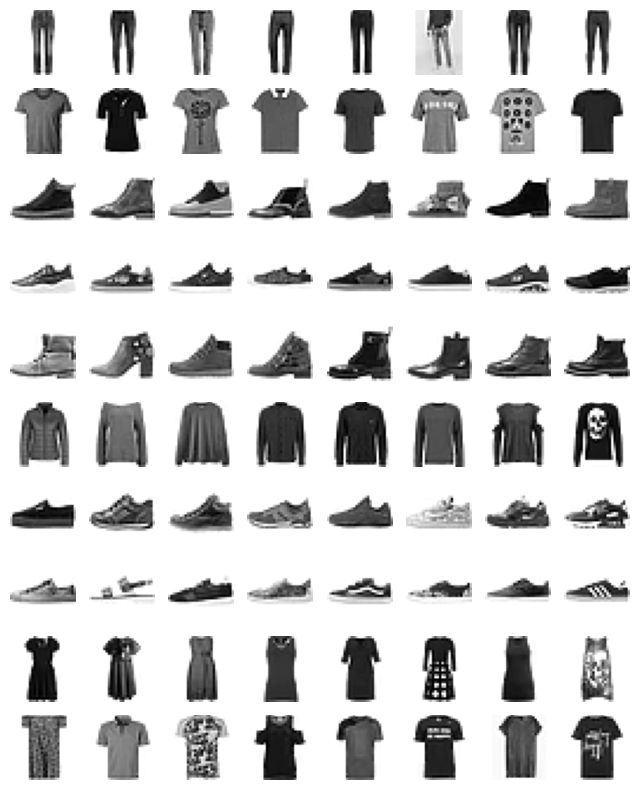

In [11]:
from collections import Counter

n_hashes = 10
n_images = 8

top_hashes = Counter(hashes).most_common(n_hashes)

plt.figure(figsize=(n_images, n_hashes))
for hash_index, (image_hash, hash_count) in enumerate(top_hashes):
    indices = (hashes == image_hash)
    for index, image in enumerate(X_valid[indices][:n_images]):
        plt.subplot(n_hashes, n_images, hash_index * n_images + index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

plt.show()